# traditional 3d reconstruction methods
Xiao Wang

# libraries

In [1]:
import sys
from pathlib import Path

ROOT = Path.cwd().resolve().parent
sys.path.insert(0, str(ROOT))

print("cwd:", Path.cwd())
print("ROOT added to sys.path:", ROOT)

import cv2
import numpy as np
import os
import glob
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull

from projector_camera_calibration import calib_recon_utils as utils
from traditional_3d_reconstruction import decode_pattern

%load_ext autoreload
%autoreload 2

cwd: c:\github_repo\Stru_Illumination\projector-camera-control-system\traditional_3d_reconstruction
ROOT added to sys.path: C:\github_repo\Stru_Illumination\projector-camera-control-system
Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
print("--- package version ---")
print("OpenCV version:", cv2.__version__)
print("NumPy version:", np.__version__)
print("---------------------\n")

%matplotlib inline
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams.update({'font.size': 10}) 
plt.rcParams['figure.dpi'] = 200
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['image.cmap'] = 'gray'

%reload_ext autoreload

--- package version ---
OpenCV version: 4.12.0
NumPy version: 2.2.6
---------------------



# working directory

In [5]:
# set folder name
folder_name = "12052025"
root_dir = r"../projection_exp_capture/" + folder_name
print("Image directory set to:", root_dir)

Image directory set to: ../projection_exp_capture/12052025


In [6]:
os.listdir(root_dir)

['1',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9']

# gray code   

### gray code parameters setup

In [7]:
# TARGETDIR = "./GrayCodePatterns"
CAPTUREDDIR = root_dir  # process the synthetic bit 0 gray code
bit0_synthetic_flag = True  # process the synthetic bit 0 gray code
gc_step = 1  # Logic-pixel pitch (default 1 → mim width of gray code=2 px).
if gc_step > 1:
    bit0_synthetic_flag = False  # process the synthetic bit 0 gray code
proj_height = 768  # Height of the projector image (default 720 px).
proj_width = 768  # Width of the projector image (default 1280 px).
proj_shape = (proj_height, proj_width)  # Shape of the projector image.

black_thr = 10  # threashold to determine whether a camera pixel captures projected area or not (default : 40)
white_thr = 10  # threashold to specify the robustness of gray code decoding. To avoid decoding errors, increase these variables (default: 5).

gc_height = int((proj_shape[0] - 1) / gc_step) + 1
gc_width = int((proj_shape[1] - 1) / gc_step) + 1
graycode = cv2.structured_light.GrayCodePattern.create(gc_width, gc_height)
num_one_direction_patterns = int(graycode.getNumberOfPatternImages() / 2)
num_one_direction_patterns

20

In [8]:
pairs = [
    ("HorBit0_Shifted_0", "HorBit0_Shifted_1"),
    ("HorBit0_Shifted_0_Inverse", "HorBit0_Shifted_1_Inverse"),
    ("VerBit0_Shifted_0", "VerBit0_Shifted_1"),
    ("VerBit0_Shifted_0_Inverse", "VerBit0_Shifted_1_Inverse"),
]

In [9]:
print("--- Loading captured image directories ---")

# 1. find numeric folders
all_dirs = [d for d in glob.glob(CAPTUREDDIR + "/*") if os.path.isdir(d)]
digit_dirs = [
    d
    for d in all_dirs
    if os.path.isdir(d) and os.path.basename(os.path.normpath(d)).isdigit()
]

# 2. sort by numeric name
sorted_dirs = sorted(digit_dirs, key=lambda d: int(os.path.basename(d)))

if not sorted_dirs:
    print(f"No numeric directories found in '{CAPTUREDDIR}'")
    sys.exit(1)

if bit0_synthetic_flag:
    for dir_path in tqdm(sorted_dirs, desc="Processing folders"):
        print(f"Processing directory: {dir_path}")
        utils.process_bit0_numeric_files_3d_recon(dir_path, pairs)

# 3. pick first 10 and last for display
if len(sorted_dirs) > 11:
    display_dirs = sorted_dirs[:10] + [sorted_dirs[-1]]
else:
    display_dirs = sorted_dirs

print(f"Found {len(sorted_dirs)} directories in '{CAPTUREDDIR}':")

# --------------------------- Modified loading logic ---------------------------
used_dirnames = []
gc_fname_lists = []

for d in sorted_dirs:

    # 1. Find all NN_00.png files (filtering out HorBit, VerBit, SynthBit, Inverse...)
    pngs_all = glob.glob(os.path.join(d, "*.png"))
    pngs_num = sorted(
        [p for p in pngs_all if utils.is_graycode_main_file(p)],
        key=lambda f: int(os.path.basename(f).split("_")[0]),
    )

    if len(pngs_num) < 2:
        print(f"Directory {d} does not contain at least 2 valid base images.")
        continue

    # mandatory files: 00_00.png, 01_00.png
    mandatory = pngs_num[:2]

    # rest of GrayCode images
    gray_rest = pngs_num[2:]

    # calculate the number of patterns per direction
    total_rest = len(gray_rest)
    half_total_rest = int(total_rest / 2)
    group_size = num_one_direction_patterns

    if total_rest < 2 * group_size:
        print(f"Warning: directory {d} does not have enough GrayCode files.")
        continue

    # first group
    group_A = gray_rest[:group_size]

    # second group
    group_B = gray_rest[half_total_rest : half_total_rest + group_size]

    # final selected list
    selected_pngs = mandatory + group_A + group_B

    used_dirnames.append(d)
    gc_fname_lists.append(selected_pngs)


# 5. now print tree for display_dirs only
for idx, d in enumerate(display_dirs):
    try:
        # after the 10th entry, show ellipsis if there are more
        if idx == 10 and len(sorted_dirs) > 11:
            print("│   ......\n")

        dir_name = os.path.basename(d)
        branch = "└───" if idx == len(display_dirs) - 1 else "├───"
        print(f"{branch}{dir_name}")

        # grab the full list we collected earlier
        pngs = gc_fname_lists[used_dirnames.index(d)]

        # pick first 10 + last for display
        if len(pngs) > 11:
            display_files = pngs[:10] + [pngs[-1]]
        else:
            display_files = pngs

        for j, fpath in enumerate(display_files):
            # after the 10th file, show ellipsis if there are more
            if j == 10 and len(pngs) > 11:
                print("│   │   ...")

            fname = os.path.basename(fpath)
            fbranch = "└───" if j == len(display_files) - 1 else "├───"
            print(f"│   {fbranch}{fname}")

        # print a separator line except after the last displayed directory
        if idx < len(display_dirs) - 2:
            print("│")
    except Exception as e:
        print(f"Error displaying directory {d}: {e}")

--- Loading captured image directories ---


Processing folders:   0%|          | 0/15 [00:00<?, ?it/s]

Processing directory: ../projection_exp_capture/12052025\1
No number-starting files found.
Processing directory: ../projection_exp_capture/12052025\2
Files selected for replacement:
   20_00.png
   21_00.png
   40_00.png
   41_00.png
Moving ../projection_exp_capture/12052025\2\20_00.png -> ../projection_exp_capture/12052025\2\org_bit0\20_00.png
Moving ../projection_exp_capture/12052025\2\21_00.png -> ../projection_exp_capture/12052025\2\org_bit0\21_00.png
Moving ../projection_exp_capture/12052025\2\40_00.png -> ../projection_exp_capture/12052025\2\org_bit0\40_00.png
Moving ../projection_exp_capture/12052025\2\41_00.png -> ../projection_exp_capture/12052025\2\org_bit0\41_00.png
Writing new diff image: ../projection_exp_capture/12052025\2\20_00.png
Writing new diff image: ../projection_exp_capture/12052025\2\21_00.png
Writing new diff image: ../projection_exp_capture/12052025\2\40_00.png
Writing new diff image: ../projection_exp_capture/12052025\2\41_00.png
✓ Processing complete.

Proces

In [16]:
folder_number = 1  # change this number to load different folders
folder_path = used_dirnames[folder_number]
folder_path

'../projection_exp_capture/12052025\\4'

## opencv decode method  
reference: https://docs.opencv.org/4.12.0/dc/da9/tutorial_decode_graycode_pattern.html

## opencv decode method + local homography method  
reference: D. Moreno and G. Taubin, "Simple, Accurate, and Robust Projector-Camera Calibration," 2012 Second International Conference on 3D Imaging, Modeling, Processing, Visualization & Transmission, Zurich, Switzerland, 2012, pp. 464-471, doi: 10.1109/3DIMPVT.2012.77.

### decode projector correspondence map

In [17]:
folder_path

'../projection_exp_capture/12052025\\4'

In [18]:
img_shape = cv2.imread(folder_path + "/00_00.png", cv2.IMREAD_GRAYSCALE).shape
img_shape

(928, 928)

In [19]:
gray_decode_method = "opencv"

In [20]:
if gray_decode_method == "opencv":
    projector_coords, mask_valid = decode_pattern.decode_graycode(
        folder=folder_path,
        proj_w=proj_width,
        proj_h=proj_height,
        black_thr=black_thr,
        white_thr=white_thr,
    )
elif gray_decode_method == "opencv + local homography":
    projector_coords, mask_valid = decode_pattern.decode_graycode_refined(
        folder=folder_path,
        proj_w=proj_width,
        proj_h=proj_height,
        black_thr=black_thr,
        white_thr=white_thr,
        patch_half=int(np.ceil(img_shape[0] / 180)),  # patch size = 2*patch_half + 1
        min_valid_pts=int(
            np.ceil(img_shape[0] / 180) ** 2
        ),  # minimum pts for homography
    )

Camera image size: 928 x 928
Projector panel size: 768 x 768
GrayCodePattern expects: 40 pattern images
Start decoding each pixel...


  0%|          | 0/928 [00:00<?, ?it/s]

Decoding finished.


## plot correspondence map

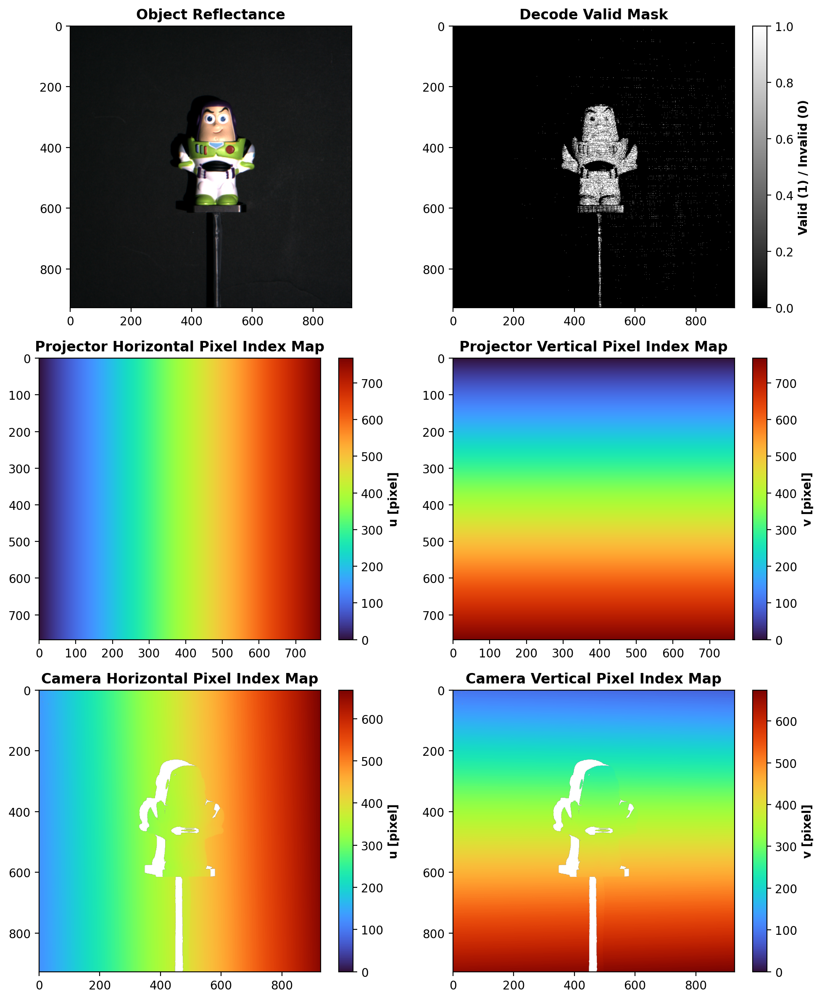

In [21]:
u_map = projector_coords[:, :, 0].astype(np.float32)
v_map = projector_coords[:, :, 1].astype(np.float32)
img_white = cv2.imread(folder_path + "/00_00.png", cv2.IMREAD_COLOR)
img_white = cv2.cvtColor(img_white, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

cam_u = np.arange(img_white.shape[1]).reshape(1, -1).repeat(img_white.shape[0], axis=0)
proj_u = np.arange(proj_width).reshape(1, -1).repeat(proj_height, axis=0)
cam_v = np.arange(img_white.shape[0]).reshape(-1, 1).repeat(img_white.shape[1], axis=1)
proj_v = np.arange(proj_height).reshape(-1, 1).repeat(proj_width, axis=1)
# ---------------- Plotting ----------------
plt.figure(figsize=(10, 12))

# ---------------- Row 1 ----------------
plt.subplot(3, 2, 1)
plt.title("Object Reflectance")
plt.imshow(img_white)
# plt.colorbar(label="Reflectance")
# plt.axis("off")

plt.subplot(3, 2, 2)
plt.title("Decode Valid Mask")
plt.imshow(mask_valid, cmap="gray")
plt.colorbar(label="Valid (1) / Invalid (0)")
# plt.axis("off")

# ---------------- Row 2 ----------------
plt.subplot(3, 2, 3)
plt.title("Projector Horizontal Pixel Index Map")

plt.imshow(proj_u, cmap="turbo", vmin=0, vmax=proj_width)
plt.colorbar(label="u [pixel]")
# plt.axis("off")

plt.subplot(3, 2, 4)
plt.title("Projector Vertical Pixel Index Map")

plt.imshow(proj_v, cmap="turbo", vmin=0, vmax=proj_height)
plt.colorbar(label="v [pixel]")
# plt.axis("off")

# ---------------- Row 3 ----------------
plt.subplot(3, 2, 5)
plt.title("Camera Horizontal Pixel Index Map")
plt.imshow(u_map, cmap="turbo", vmin=0, vmax=np.nanmax(u_map))
plt.colorbar(label="u [pixel]")
# plt.axis("off")

plt.subplot(3, 2, 6)
plt.title("Camera Vertical Pixel Index Map")
plt.imshow(v_map, cmap="turbo", vmin=0, vmax=np.nanmax(v_map))
plt.colorbar(label="v [pixel]")
# plt.axis("off")

plt.tight_layout()
plt.show()

## crop roi

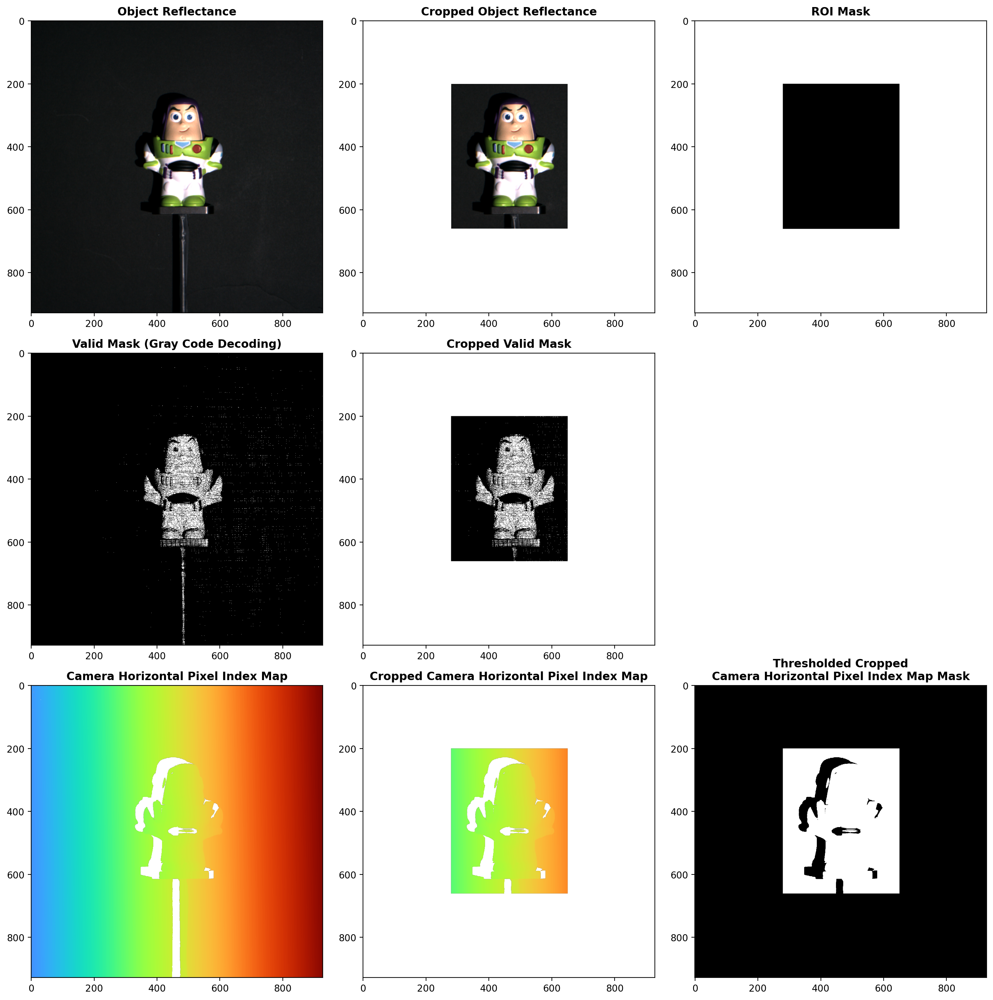

In [22]:
roi_mask = utils.create_rect_mask(mask_valid.shape, (280, 200), (650, 660))
roi_mask = np.where(roi_mask > 0, 1, np.nan)
point_mask = mask_valid * roi_mask
pixel_map_mask = np.where(roi_mask > 0, u_map, np.nan) > 0

plt.figure(figsize=(15, 15))

# ---------------- Row 1 ----------------
plt.subplot(3, 3, 1)
plt.imshow(img_white)
plt.title("Object Reflectance")
# plt.axis("off")
roi_mask_expanded = np.expand_dims(roi_mask, axis=2)
roi_mask_expanded = np.tile(roi_mask_expanded, (1, 1, img_white.shape[2]))
plt.subplot(3, 3, 2)
plt.imshow(img_white * roi_mask_expanded)
plt.title("Cropped Object Reflectance")
# plt.axis("off")

plt.subplot(3, 3, 3)
plt.imshow(roi_mask, cmap="gray")
plt.title("ROI Mask")
# plt.axis("off")

# ---------------- Row 2 ----------------
plt.subplot(3, 3, 4)
plt.imshow(mask_valid, cmap="gray")
plt.title("Valid Mask (Gray Code Decoding)")
# plt.axis("off")

plt.subplot(3, 3, 5)
plt.imshow(point_mask, cmap="gray")
plt.title("Cropped Valid Mask")
# plt.axis("off")

# (slot 6 intentionally unused)

# ---------------- Row 3 ----------------
plt.subplot(3, 3, 7)
plt.imshow(
    u_map,
    cmap="turbo",
    vmin=0,
    vmax=np.nanmax(u_map),
)
plt.title("Camera Horizontal Pixel Index Map")
# plt.axis("off")

plt.subplot(3, 3, 8)
plt.imshow(
    roi_mask * u_map,
    cmap="turbo",
    vmin=0,
    vmax=np.nanmax(u_map),
)
plt.title("Cropped Camera Horizontal Pixel Index Map")
# plt.axis("off")

plt.subplot(3, 3, 9)
plt.imshow(pixel_map_mask)
plt.title("Thresholded Cropped\nCamera Horizontal Pixel Index Map Mask")
# plt.axis("off")

plt.tight_layout()
plt.show()

## triangulation and save 3d point cloud

In [23]:
# load calibration
(
    K_c,
    dist_c,
    K_p,
    dist_p,
    R_cp,
    t_cp,
    R_world_to_cam,
    R_cam_to_world,
    t_new,
    t_cam_to_world,
) = utils.load_calibration(
    "../calibration_capture/11202025/11202025_final_calibration_summary.json"
)

# load your decoded results
# projector_coords: (H,W,2)
# mask_valid: (H,W)
projector_coords, mask_valid = projector_coords, pixel_map_mask

# triangulate (camera coordinates)
points_cam = utils.triangulate_cam_frame(
    projector_coords, mask_valid, K_c, dist_c, K_p, dist_p, R_cp, t_cp
)
# pointcloud_camera_path = os.path.join(folder_path, "pointcloud_camera.npy")
# np.save(pointcloud_camera_path, points_cam)
# print(f"Saved NPY: {pointcloud_camera_path}")

# OPTIONAL → convert to world coordinates
points_world = utils.cam_to_world(
    points_cam, mask_valid, R_cam_to_world, t_cam_to_world
)
# pointcloud_world_path = os.path.join(folder_path, "pointcloud_world.npy")
# np.save(pointcloud_world_path, points_world)
# print(f"Saved NPY: {pointcloud_world_path}")

# save PLY files
pointcloud_camera_ply_path = os.path.join(folder_path, "pointcloud_camera.ply")
utils.save_pointcloud_ply(
    filename=pointcloud_camera_ply_path,
    points=points_cam,
    valid_mask=mask_valid,
    rgb_image=img_white,
    gray_image=None,
    image_value_scale=1.0,
)
pointcloud_world_ply_path = os.path.join(folder_path, "pointcloud_world.ply")
utils.save_pointcloud_ply(
    filename=pointcloud_world_ply_path,
    points=points_world,
    valid_mask=mask_valid,
    rgb_image=img_white,
    gray_image=None,
    image_value_scale=1.0,
)

Saved PLY: ../projection_exp_capture/12052025\4\pointcloud_camera.ply  (points = 152247)
Saved PLY: ../projection_exp_capture/12052025\4\pointcloud_world.ply  (points = 152247)


## plot 3d point cloud

In [24]:
# utils.plot_pointcloud_plotly(
#     points_world,
#     valid_mask=mask_valid,
#     title="Point Cloud in World Coordinates",
#     plot_width=800,
#     plot_height=600,
# )
utils.plot_pointcloud_plotly(
    points_cam,
    valid_mask=mask_valid,
    rgb=np.where(img_white > 1e-3, img_white - 1e-3, 0.0),
    title="Point Cloud in Camera Coordinates",
    plot_width=800,
    plot_height=600,
)

## plot height/depth map

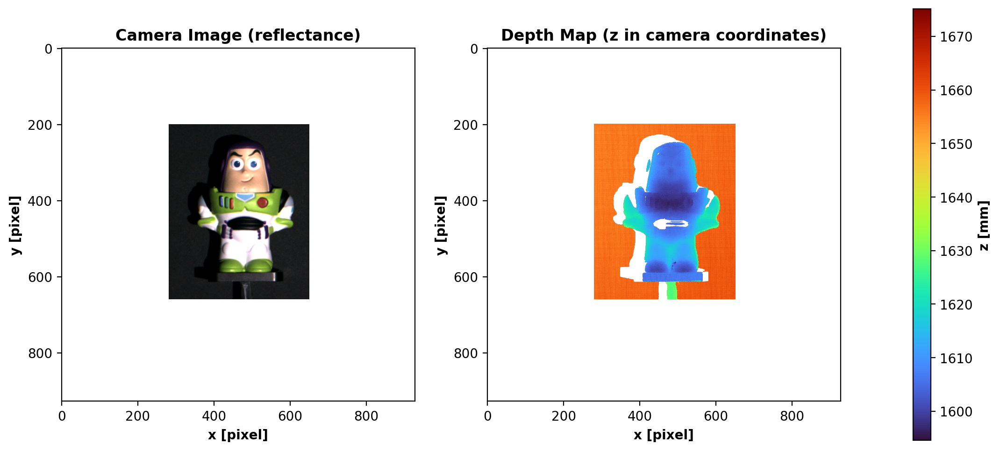

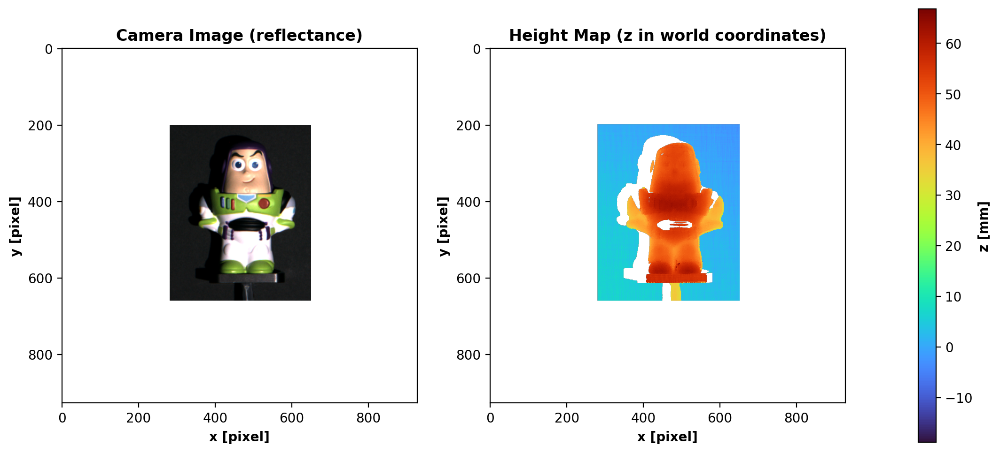

In [43]:
height_map = utils.show_image_and_heightmap(
    img_white * roi_mask_expanded,
    points_cam,
    mask_valid,
    vmin=None,
    vmax=None,
    titles=["Camera Image (reflectance)", "Depth Map (z in camera coordinates)"],
)
height_map = utils.show_image_and_heightmap(
    img_white * roi_mask_expanded,
    points_world,
    mask_valid,
    vmin=None,
    vmax=None,
    titles=["Camera Image (reflectance)", "Height Map (z in world coordinates)"],
)

## filter 3d point cloud

In [25]:
xyz_valid, valid_idx, H, W = utils.flatten_and_filter_nan_with_index(points_cam)

xyz_sor, ind_sor = utils.o3d_statistical_outlier_removal(
    xyz_valid, nb_neighbors=30, std_ratio=2.0
)

d_med, _ = utils.estimate_spacing(
    xyz_sor,
    sample=xyz_sor.shape[0] if xyz_sor.shape[0] < 5e5 else int(5e5),
)

xyz_ror, ind_ror = utils.o3d_radius_outlier_removal(
    xyz_sor, radius=3.0 * d_med, nb_points=6
)

# Compose indices: xyz_valid -> xyz_sor -> xyz_ror
ind_sor = np.asarray(ind_sor, dtype=np.int64)
ind_ror = np.asarray(ind_ror, dtype=np.int64)
keep_idx_in_valid = ind_sor[
    ind_ror
]  # indices into xyz_valid that survived both filters

# Write back to (H,W,3), everything else stays NaN
xyz_out = np.full((H * W, 3), np.nan, dtype=np.float64)
xyz_out[valid_idx[keep_idx_in_valid]] = xyz_valid[keep_idx_in_valid]

points_cam_filtered = xyz_out.reshape(H, W, 3)

In [46]:
# points_cam_filtered = utils.aggregate_by_xy_bins(
#     points_cam_ror, dx=0.2 * d_med, agg="median"
# )

## height/depth map filling and filtering

Z before fill: 1594.8636474609375 1661.759521484375
Z after fill: 1594.8636474609375 1661.759521484375
Z before median filter: 1594.8636474609375 1661.759521484375
Z after median filter: 1595.7462158203125 1661.139892578125


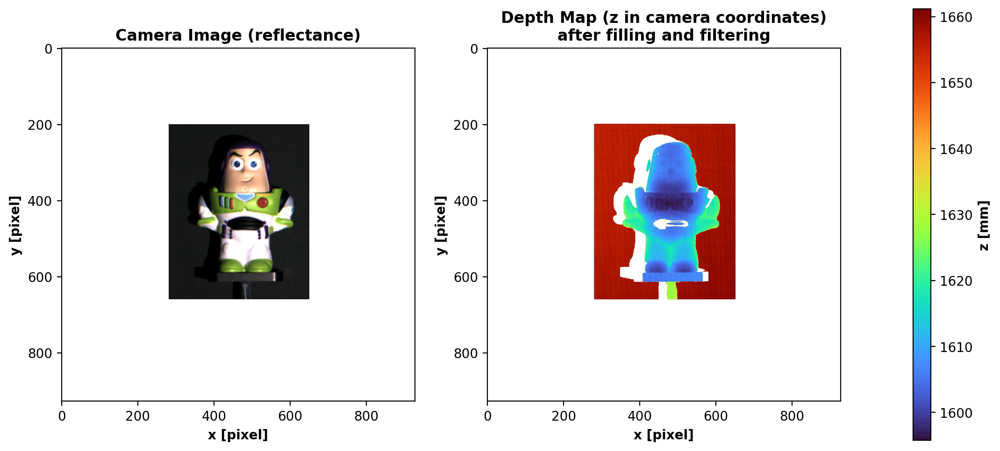

Z before fill: -3.3804665 63.34775
Z after fill: -3.4478037 63.34775
Z before median filter: -3.4478037 63.34775
Z after median filter: -3.0228438 63.189144


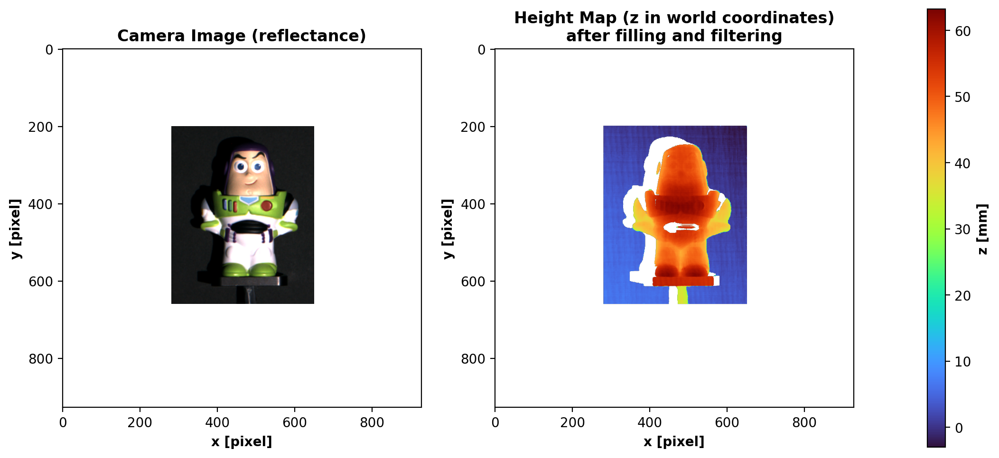

In [26]:
points_cam_filled = utils.inpaint_height_map_cv(
    points_cam_filtered,
    valid_mask=pixel_map_mask,
    inpaint_radius=3.0,
    method="telea",
)
points_cam_clean = utils.median_filter_in_mask(
    points_cam_filled,
    valid_mask=pixel_map_mask,
    ksize=3,
)
height_map = utils.show_image_and_heightmap(
    img_white * roi_mask_expanded,
    points_cam_clean,
    pixel_map_mask,
    vmin=None,
    vmax=None,
    titles=[
        "Camera Image (reflectance)",
        "Depth Map (z in camera coordinates)\nafter filling and filtering",
    ],
)


points_world_new = utils.cam_to_world(
    points_cam_clean, mask_valid, R_cam_to_world, t_cam_to_world
)

points_world_filled = utils.inpaint_height_map_cv(
    points_world_new,
    valid_mask=pixel_map_mask,
    inpaint_radius=3.0,
    method="telea",
)
points_world_clean = utils.median_filter_in_mask(
    points_world_filled,
    valid_mask=pixel_map_mask,
    ksize=3,
)
height_map = utils.show_image_and_heightmap(
    img_white * roi_mask_expanded,
    points_world_clean,
    pixel_map_mask,
    vmin=None,
    vmax=None,
    titles=[
        "Camera Image (reflectance)",
        "Height Map (z in world coordinates)\nafter filling and filtering",
    ],
)

## save cleaned point clouds

In [27]:
pointcloud_camera_ply_path = os.path.join(folder_path, "pointcloud_camera_clean.ply")
utils.save_pointcloud_ply(
    filename=pointcloud_camera_ply_path,
    points=points_cam_clean,
    valid_mask=mask_valid,
    rgb_image=img_white,
    gray_image=None,
    image_value_scale=1.0,
)
pointcloud_world_ply_path = os.path.join(folder_path, "pointcloud_world_clean.ply")
utils.save_pointcloud_ply(
    filename=pointcloud_world_ply_path,
    points=points_world_clean,
    valid_mask=mask_valid,
    rgb_image=img_white,
    gray_image=None,
    image_value_scale=1.0,
)

Saved PLY: ../projection_exp_capture/12052025\4\pointcloud_camera_clean.ply  (points = 149946)
Saved PLY: ../projection_exp_capture/12052025\4\pointcloud_world_clean.ply  (points = 149946)


## height/depth map interpolation

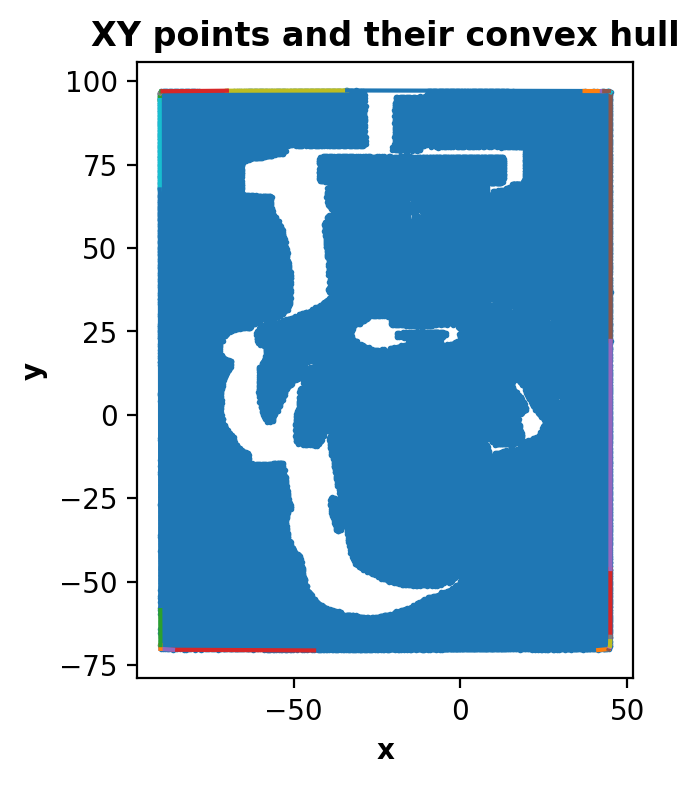

In [28]:
# pointcloud: (N,M,3)
xyz = points_cam_clean.reshape(-1, 3)
xy = xyz[:, :2]

# (Optional) remove NaNs / infs if you have invalid pixels
mask = np.isfinite(xy).all(axis=1)
xy = xy[mask]

hull = ConvexHull(xy)

plt.figure()
plt.scatter(xy[:, 0], xy[:, 1], s=1)  # all projected points
# draw hull edges
for simplex in hull.simplices:
    p = xy[simplex]
    plt.plot(p[:, 0], p[:, 1])
plt.gca().set_aspect("equal", adjustable="box")
plt.title("XY points and their convex hull")
plt.xlabel("x")
plt.ylabel("y")
plt.show()
# hull polygon vertices in order (approximately)

In [29]:
rgb_albedo = np.reshape(img_white * roi_mask_expanded, (-1, 3))  # (P,3)
good = np.isfinite(xyz).all(axis=1)  # x,y,z all finite
rgb_albedo_valid = rgb_albedo[good]  # only valid 3D points

xyz = points_cam_clean.reshape(-1, 3)  # (P,3)

xyz_cam_valid = xyz[good]  # only valid 3D points

xyz = points_world_clean.reshape(-1, 3)  # (P,3)
xyz_world_valid = xyz[good]  # only valid 3D points

In [30]:
x = np.linspace(-200, 200, 1024)  # [mm]
y = np.linspace(-200, 200, 1024)  # [mm]
X, Y = np.meshgrid(x, y)
interp_depth = utils.TINInterpXY(
    xyz_cam_valid,
    feat_valid=rgb_albedo_valid,
    fill_value=np.nan,
    max_edge=3 * (x[1] - x[0]),
)
interp_height = utils.TINInterpXY(
    xyz_world_valid,
    feat_valid=rgb_albedo_valid,
    fill_value=np.nan,
    max_edge=3 * (x[1] - x[0]),
)

# Evaluate z on the meshgrid (same shape as X, Y)
Z_depth, interp_rgb_albedo_depth = interp_depth(
    X, Y, return_feat=True
)  # Z.shape == (1024, 1024)
Z_height, interp_rgb_albedo_height = interp_height(
    X, Y, return_feat=True
)  # Z.shape == (1024, 1024)

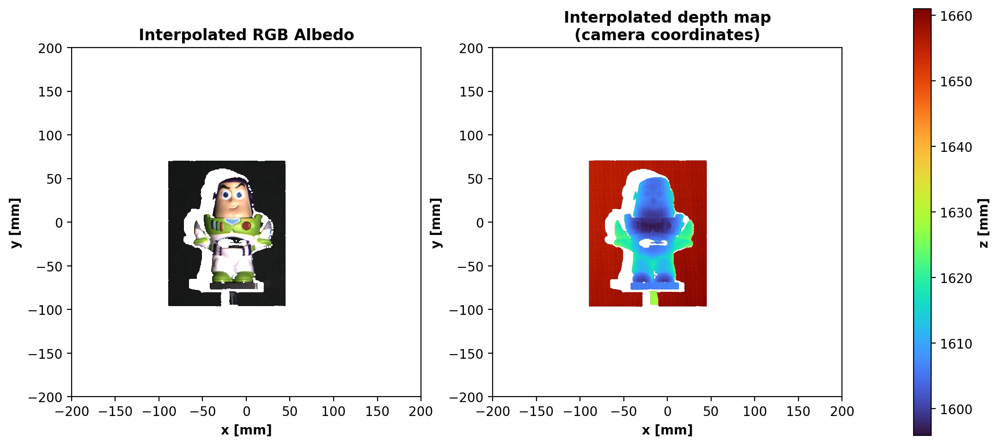

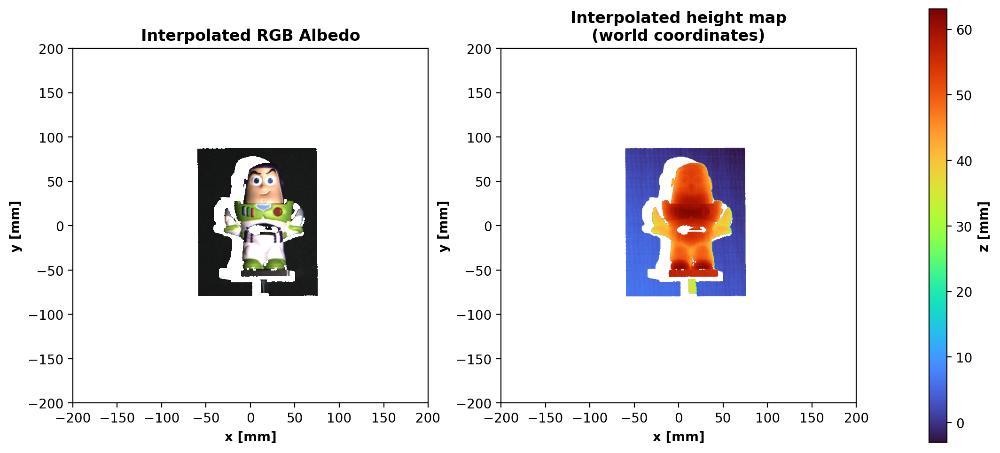

In [31]:
_ = utils.show_image_and_heightmap(
    interp_rgb_albedo_depth,
    Z_depth,
    None,
    vmin=None,
    vmax=None,
    extent=[[x.min(), x.max(), y.min(), y.max()], [x.min(), x.max(), y.min(), y.max()]],
    units=["mm", "mm"],
    titles=[
        "Interpolated RGB Albedo",
        "Interpolated depth map\n(camera coordinates)",
    ],
    origin="upper",
)
_ = utils.show_image_and_heightmap(
    interp_rgb_albedo_height,
    Z_height,
    None,
    vmin=None,
    vmax=None,
    extent=[[x.min(), x.max(), y.min(), y.max()], [x.min(), x.max(), y.min(), y.max()]],
    units=["mm", "mm"],
    titles=[
        "Interpolated RGB Albedo",
        "Interpolated height map\n(world coordinates)",
    ],
    origin="lower",
)

In [32]:
np.save(os.path.join(folder_path, "interp_depth_cam.npy"), Z_depth)
np.save(os.path.join(folder_path, "interp_rgb_albedo_cam.npy"), interp_rgb_albedo_depth)
np.save(os.path.join(folder_path, "interp_height_world.npy"), Z_height)
np.save(
    os.path.join(folder_path, "interp_rgb_albedo_world.npy"), interp_rgb_albedo_height
)

In our pipeline, we first perform triangulation in the camera coordinate system to obtain 3D points
$$
\overrightarrow{P}_{\text{cam}} =[X_c, Y_c, Z_c]^{\top}.
$$
We then transform these points into the world coordinate system using the extrinsic parameters
$$
\begin{align*}
\overrightarrow{P}_{\text{world}} &= R\overrightarrow{P}_{\text{cam}} + \overrightarrow{t}, \\
\begin{bmatrix}
X_\text{world}\\
Y_\text{world}\\
Z_\text{world}
\end{bmatrix}
&=
\begin{bmatrix}
r_{00} & r_{01} & r_{02}\\
r_{10} & r_{11} & r_{12}\\
r_{20} & r_{21} & r_{22}
\end{bmatrix}
\begin{bmatrix}
X_c\\
Y_c\\
Z_c
\end{bmatrix}
+
\begin{bmatrix}
t_x\\
t_y\\
t_z
\end{bmatrix},
\end{align*}
$$
and take the world-frame $Z$-component, $Z_{\text{world}}$, as the height map.

Note that $Z_{\text{world}}$ is generally of the form
$$
Z_{\text{world}} = r_{20} X_c + r_{21} Y_c + r_{22} Z_c + t_z,
$$
so it is **not** just a shifted or scaled version of the depth $Z_c$; it also mixes in the lateral coordinates $X_c$ and $Y_c$ through the rotation.

As a consequence, it can happen that a point which lies smoothly on a plane in the camera coordinate system becomes a much lower (or higher) outlier in the world coordinate system, due to the specific combination of $R$, $t$, small calibration errors, and measurement noise. In the local neighborhood of that point in the world-frame height map, the center pixel may take a value like $-39$ while most neighbors lie between $-10$ and $0$. A median filter applied in this space will then replace the extreme value $-39$ with something close to the local median (e.g. around $-9$), effectively “filling in” a deep pit.

In contrast, in the depth map (camera $Z_c$) the same physical point may differ from its neighbors only slightly (e.g. $1578$ vs. neighbors around $1580$), so the local median remains almost unchanged and the minimum value is barely affected.

Therefore, the observed change in the minimum of the world-frame height map is caused by by the fact that the geometric transformation into the world frame alters the local statistical structure of the data, making certain points appear as stronger outliers that are then suppressed by the median filter.
